In [3]:
from PIL import Image
import os
import shutil
import pandas as pd
import numpy as np
import random
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow import keras
from sklearn.model_selection import train_test_split
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from sklearn.metrics import classification_report, confusion_matrix, ConfusionMatrixDisplay
from tensorflow.keras.models import Sequential, load_model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.layers import (Conv2D, MaxPooling2D, AveragePooling2D, BatchNormalization, Flatten, Dense, Dropout)
from mlxtend.plotting import plot_confusion_matrix
from tensorflow.keras.utils import to_categorical, plot_model
from keras.callbacks import ReduceLROnPlateau, EarlyStopping, ModelCheckpoint
import warnings

2025-04-06 17:11:14.527449: I tensorflow/core/platform/cpu_feature_guard.cc:210] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [4]:
path='/Users/gamalielmarines/Downloads/CNN-Reto-Benji/ALL Image Dataset/Original'
pd.DataFrame(os.listdir(path),columns=['Files'])

,Files
0,Early
1,.DS_Store
2,Pro
3,Benign
4,Pre


In [35]:
data_dir =path
batch_size = 32
target_size = (224, 224)

train = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.4,
    subset="training",
    seed=200,
    image_size=target_size,
    batch_size=batch_size,
)

validation = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.20,
    subset="validation",
    seed=44,
    image_size=target_size,
    batch_size=batch_size,
)

test = tf.keras.preprocessing.image_dataset_from_directory(
    data_dir,
    validation_split=0.20,
    subset="validation",
    seed=100,
    image_size=target_size,
    batch_size=batch_size,
)

Found 3256 files belonging to 4 classes.
Using 1954 files for training.
Found 3256 files belonging to 4 classes.
Using 651 files for validation.
Found 3256 files belonging to 4 classes.
Using 651 files for validation.


In [36]:
class_names = train.class_names
print("Class Names:", class_names)

Class Names: ['Benign', 'Early', 'Pre', 'Pro']


In [37]:
train_size = len(list(train))
val_size = len(list(validation))
test_size = len(list(test))

2025-04-06 18:16:50.205751: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-06 18:16:50.982989: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Train Size: 62 Validation Size: 21 Test Size: 21


2025-04-06 18:16:51.261130: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [38]:
print("Train Size:", train_size, "Validation Size:", val_size, "Test Size:", test_size)

Train Size: 62 Validation Size: 21 Test Size: 21


In [39]:
train_class_counts = np.zeros(len(class_names))
val_class_counts = np.zeros(len(class_names))
test_class_counts = np.zeros(len(class_names))

for images, labels in train:
    for label in labels.numpy():
        train_class_counts[label] += 1

for images, labels in validation:
    for label in labels.numpy():
        val_class_counts[label] += 1

for images, labels in test:
    for label in labels.numpy():
        test_class_counts[label] += 1


2025-04-06 18:17:14.225217: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-06 18:17:14.409430: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


Train Class Counts: [331. 567. 578. 478.]
Validation Class Counts: [111. 190. 194. 156.]
Test Class Counts: [ 95. 191. 206. 159.]


2025-04-06 18:17:14.667438: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [40]:
print("Train Class Counts:", train_class_counts)
print("Validation Class Counts:", val_class_counts)
print("Test Class Counts:", test_class_counts)

Train Class Counts: [331. 567. 578. 478.]
Validation Class Counts: [111. 190. 194. 156.]
Test Class Counts: [ 95. 191. 206. 159.]


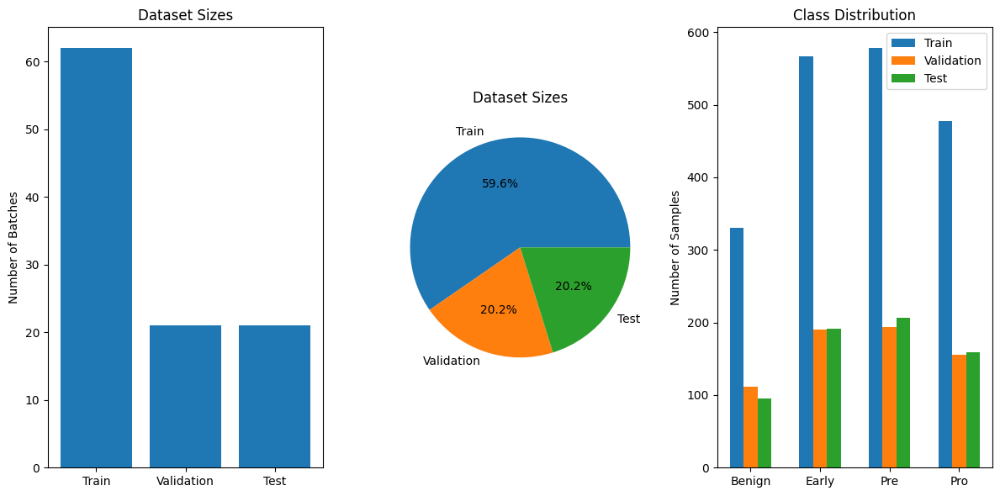

In [ ]:
# Plot the sizes of the datasets
plt.figure(figsize=(18, 6))

plt.subplot(1, 3, 1)
plt.bar(['Train', 'Validation', 'Test'], [train_size, val_size, test_size])
plt.title('Dataset Sizes')
plt.ylabel('Number of Batches')

# Plot the class distribution in each dataset
x = np.arange(len(class_names))
width = 0.2

plt.subplot(1, 3, 2)
plt.pie([train_size, val_size, test_size], labels=['Train', 'Validation', 'Test'], autopct='%1.1f%%')
plt.title('Dataset Sizes')

plt.subplot(1, 3, 3)
plt.bar(x - width, train_class_counts, width, label='Train')
plt.bar(x, val_class_counts, width, label='Validation')
plt.bar(x + width, test_class_counts, width, label='Test')
plt.xticks(x, class_names)
plt.title('Class Distribution')
plt.ylabel('Number of Samples')
plt.legend()

plt.tight_layout()
plt.show()

2025-04-06 18:17:59.027956: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


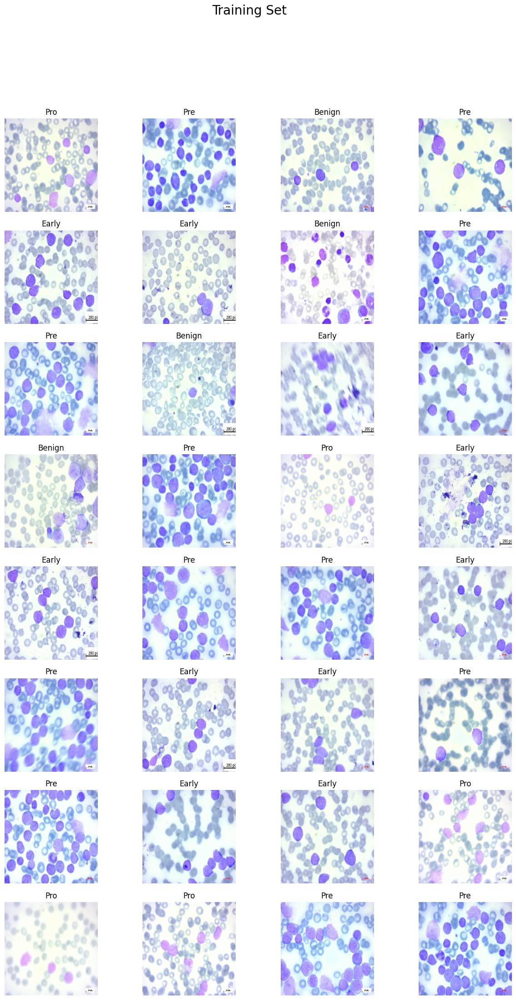

2025-04-06 18:18:03.758387: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


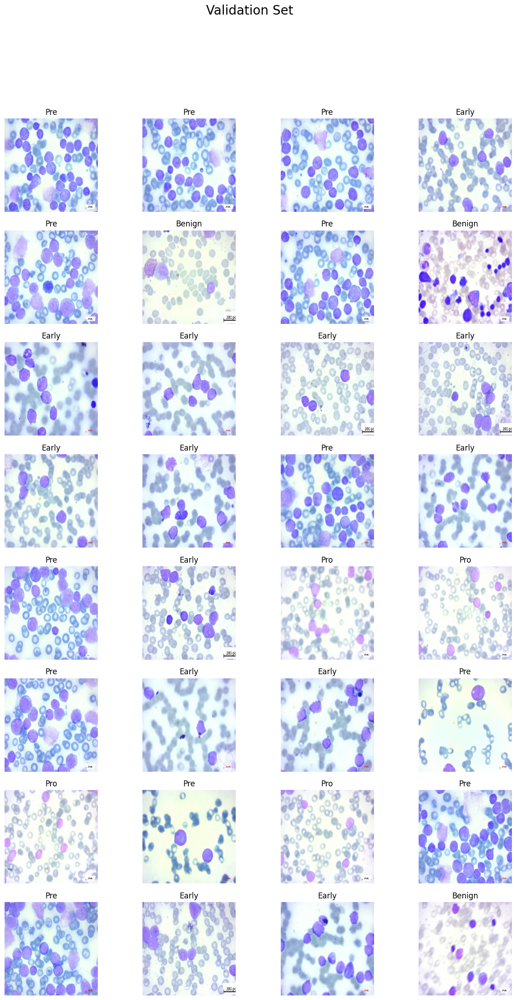

2025-04-06 18:18:08.004501: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


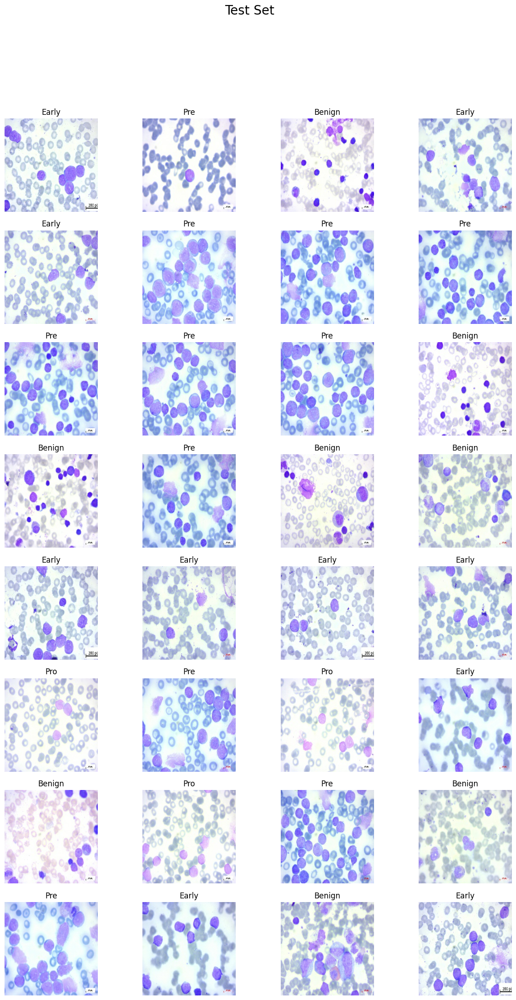

In [42]:
def plot_dataset(dataset, title):
    plt.figure(figsize=(15, 25))
    for images, labels in dataset.take(1):
        for i in range(32):
            ax = plt.subplot(8, 4, i + 1)
            plt.imshow(images[i].numpy().astype("uint8"))
            plt.title(class_names[labels[i]])
            plt.axis("off")
    plt.suptitle(title, fontsize=20)
    plt.show()

# Plot training set
plot_dataset(train, "Training Set")

# Plot validation set
plot_dataset(validation, "Validation Set")

# Plot test set
plot_dataset(test, "Test Set")

In [9]:
import ssl
ssl._create_default_https_context = ssl._create_unverified_context


In [10]:
from tensorflow.keras.applications import ResNet50
from tensorflow import keras

base_model = ResNet50(
    input_shape=(224, 224, 3),
    include_top=False,
    weights='/Users/gamalielmarines/Downloads/CNN-Reto-Benji/ResNet50 Weights.h5'
)

base_model.trainable = False

model = keras.models.Sequential([
    base_model,
    keras.layers.Flatten(),
    keras.layers.Dropout(0.5),
    keras.layers.Dense(4, activation='softmax')
])

model.compile(optimizer='adam', 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

model.build((None, 224, 224, 3))

model.summary()


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ resnet50 (Functional)           │ (None, 7, 7, 2048)     │    23,587,712 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 100352)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 4)              │       401,412 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 23,989,124 (91.51 MB)

 Trainable params: 401,412 (1.53 MB)

 Non-trainable params: 23,587,712 (89.98 MB)

In [11]:
checkpoint_cb = ModelCheckpoint("restnet_model.keras", save_best_only=True)
early_stopping_cb = EarlyStopping(patience=2, restore_best_weights=True)

model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

hist = model.fit(
    train,
    epochs=3,
    validation_data=validation,
    callbacks=[checkpoint_cb]
)


Epoch 1/3


72/72 ━━━━━━━━━━━━━━━━━━━━ 274s 4s/step - accuracy: 0.6686 - loss: 3.8103 - val_accuracy: 0.9343 - val_loss: 0.4046
Epoch 2/3
72/72 ━━━━━━━━━━━━━━━━━━━━ 239s 3s/step - accuracy: 0.9718 - loss: 0.2245 - val_accuracy: 0.9859 - val_loss: 0.0896
Epoch 3/3
72/72 ━━━━━━━━━━━━━━━━━━━━ 230s 3s/step - accuracy: 0.9911 - loss: 0.0534 - val_accuracy: 0.9785 - val_loss: 0.1388


In [12]:
score, acc = model.evaluate(validation)
print('Test Loss =', score)
print('Test Accuracy =', acc)

51/51 ━━━━━━━━━━━━━━━━━━━━ 108s 2s/step - accuracy: 0.9793 - loss: 0.1575
Test Loss = 0.13878078758716583
Test Accuracy = 0.9785012006759644


In [13]:
hist_=pd.DataFrame(hist.history)
hist_

,accuracy,loss,val_accuracy,val_loss
0,0.815789,1.879857,0.934275,0.404584
1,0.974561,0.189688,0.985872,0.089608
2,0.989474,0.054425,0.978501,0.138781


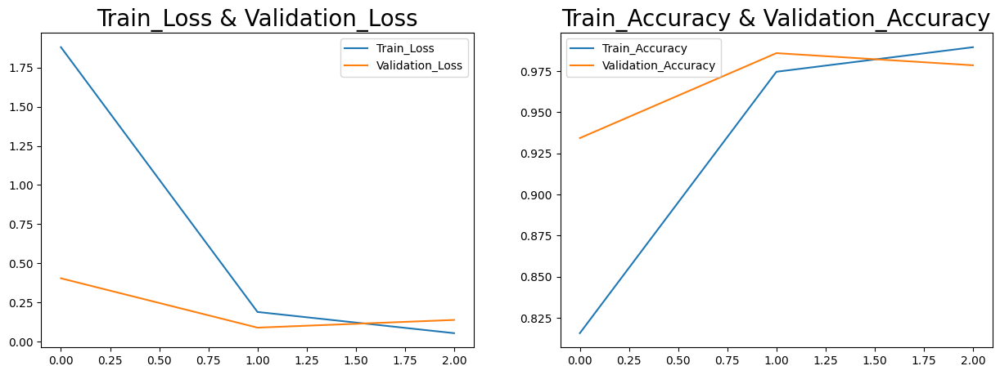

In [14]:
plt.figure(figsize=(15,5))
plt.subplot(1,2,1)
plt.plot(hist_['loss'],label='Train_Loss')
plt.plot(hist_['val_loss'],label='Validation_Loss')
plt.title('Train_Loss & Validation_Loss',fontsize=20)
plt.legend()
plt.subplot(1,2,2)
plt.plot(hist_['accuracy'],label='Train_Accuracy')
plt.plot(hist_['val_accuracy'],label='Validation_Accuracy')
plt.title('Train_Accuracy & Validation_Accuracy',fontsize=20)
plt.legend()

In [15]:
X_val,y_val,y_pred=[],[],[]
for images, labels in test:
    y_val.extend(labels.numpy())
    X_val.extend(images.numpy())
predictions=model.predict(np.array(X_val))
for i in predictions:
    y_pred.append(np.argmax(i))
df=pd.DataFrame()
df['Actual'],df['Prediction']=y_val,y_pred
df

2025-04-06 17:26:07.464811: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


51/51 ━━━━━━━━━━━━━━━━━━━━ 115s 2s/step


,Actual,Prediction
0,3,3
1,0,0
2,3,3
3,1,1
4,0,0
...,...,...
1623,2,2
1624,1,1
1625,3,3
1626,3,3


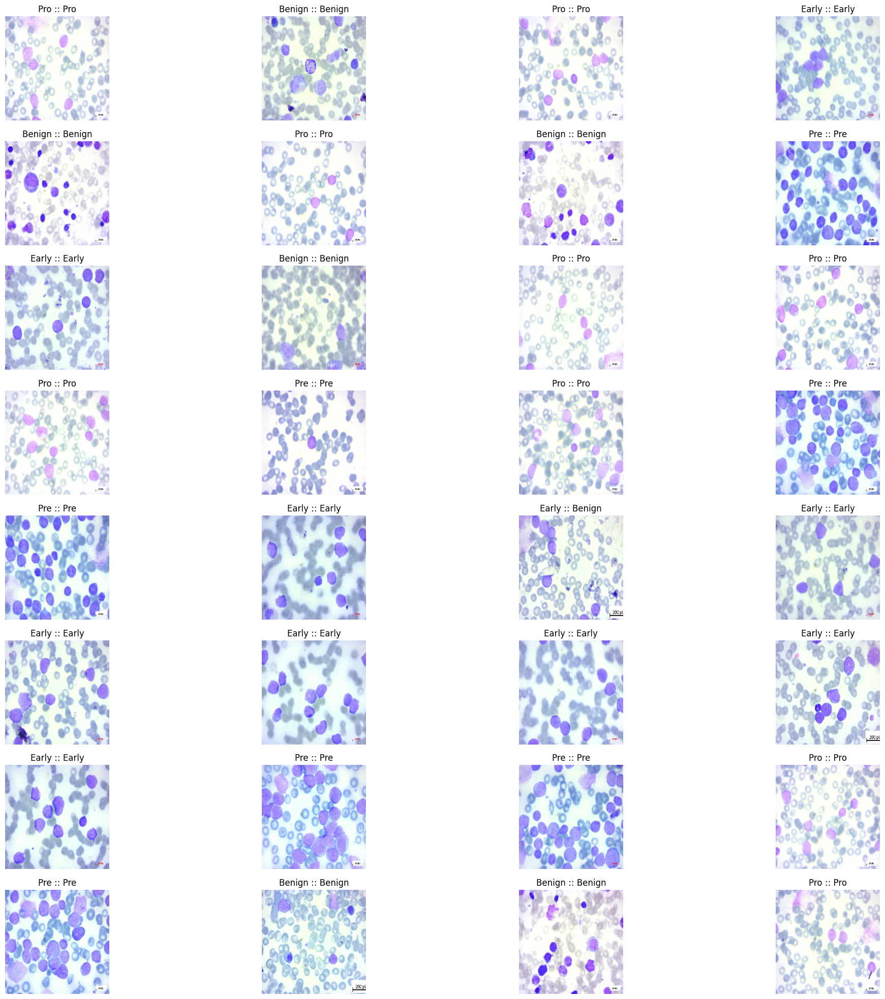

In [16]:
plt.figure(figsize=(25,25))
for i in range(32):
    ax = plt.subplot(8, 4, i + 1)
    plt.imshow(X_val[i].astype("uint8"))
    plt.title(f'{class_names[y_val[i]]} :: {class_names[y_pred[i]]}')
    plt.axis("off")

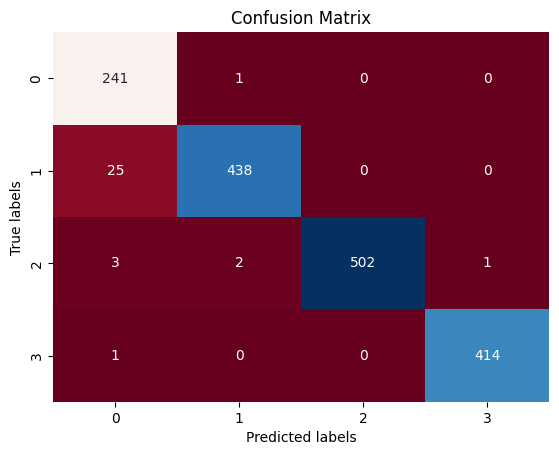

array([[241,   1,   0,   0],
       [ 25, 438,   0,   0],
       [  3,   2, 502,   1],
       [  1,   0,   0, 414]])

In [17]:
ax= plt.subplot()
CM = confusion_matrix(y_val,y_pred)
sns.heatmap(CM, annot=True, fmt='g', ax=ax,cbar=False,cmap='RdBu')
ax.set_xlabel('Predicted labels')
ax.set_ylabel('True labels') 
ax.set_title('Confusion Matrix')
plt.show()
CM

In [18]:
ClassificationReport = classification_report(y_val,y_pred)
print('Classification Report is : ', ClassificationReport )

Classification Report is :                precision    recall  f1-score   support

           0       0.89      1.00      0.94       242
           1       0.99      0.95      0.97       463
           2       1.00      0.99      0.99       508
           3       1.00      1.00      1.00       415

    accuracy                           0.98      1628
   macro avg       0.97      0.98      0.98      1628
weighted avg       0.98      0.98      0.98      1628



In [19]:
# Create a DataFrame with the information
data = {
    "Metric": ["Train Size", "Validation Size", "Test Size", "Train Loss", "Validation Loss", "Train Accuracy", "Validation Accuracy"],
    "Value": [
        len(list(train)), 
        len(list(validation)), 
        len(list(test)), 
        hist_['loss'].iloc[-1], 
        hist_['val_loss'].iloc[-1], 
        hist_['accuracy'].iloc[-1], 
        hist_['val_accuracy'].iloc[-1]
    ]
}

summary_table = pd.DataFrame(data)
print(summary_table)

2025-04-06 17:28:12.194993: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence
2025-04-06 17:28:12.894563: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


                Metric      Value
0           Train Size  72.000000
1      Validation Size  51.000000
2            Test Size  51.000000
3           Train Loss   0.054425
4      Validation Loss   0.138781
5       Train Accuracy   0.989474
6  Validation Accuracy   0.978501


2025-04-06 17:28:13.543720: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [20]:
score, acc = model.evaluate(test)
print('Test Loss =', score)
print('Test Accuracy =', acc)

51/51 ━━━━━━━━━━━━━━━━━━━━ 106s 2s/step - accuracy: 0.9762 - loss: 0.1337
Test Loss = 0.1171557754278183
Test Accuracy = 0.9797297120094299
